In [1]:
import os, sys
import pickle
from pathlib import Path
os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices'  # https://stackoverflow.com/questions/65907365/tensorflow-not-creating-xla-devices-tf-xla-enable-xla-devices-not-set
import logging
logger = logging.getLogger(__name__)
logger.level = logging.INFO
logging.getLogger().level = logging.INFO
logging.getLogger().handlers = [logging.StreamHandler(sys.stdout)]

import pandas as pd 
from scipy.spatial import cKDTree
import importlib.util
def module_from_file(module_name, file_path): #The code that imports the file which originated the training with all the instructions
            spec = importlib.util.spec_from_file_location(module_name, file_path)
            module = importlib.util.module_from_spec(spec)
            spec.loader.exec_module(module)
            return module

from importlib import import_module
#foo = import_module(fold_folder+'/Funs.py', package=None)


folder = './xforanalogs/NA24by48/Z8/yrs500/interT15fw20.1.20lrs4'
foo = module_from_file("foo", f'{folder}/Funs.py')
ef = foo.ef # Inherit ERA_Fields_New from the file we are calling
ut = foo.ut

Note: NumExpr detected 64 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
NumExpr defaulting to 8 threads.


2022-06-22 15:33:39.086150: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


path_to_ERA = '/ClimateDynamics/MediumSpace/ClimateLearningFR/gmiloshe'/ERA/
Trying to import basemap
In this environment you cannot import Basemap
Trying to import cartopy
Trying to import basemap
In this environment you cannot import Basemap
Trying to import cartopy
Successfully imported cartopy
Successfully imported cartopy
==Checking GPU==
From ./xforanalogs/NA24by48/Z8/yrs500/interT15fw20.1.20lrs4/Funs.py:46: is_gpu_available (from tensorflow.python.framework.test_util) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
==Checking CUDA==


2022-06-22 15:33:42.784061: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-22 15:33:42.817321: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 2300000000 Hz
2022-06-22 15:33:42.821746: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x55c5042613b0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2022-06-22 15:33:42.821772: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2022-06-22 15:33:42.824144: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2022-06-22 15:33:43.052046: E tensorflow/stream_execu

In [2]:
import random as rd  
from scipy.stats import norm
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn import neighbors
from sklearn.metrics import log_loss

tff = foo.tff # tensorflow routines 
ut = foo.ut # utilities
ln = foo.ln #Learn2_new.py
print("==Checking GPU==")
import tensorflow as tf
tf.test.is_gpu_available(
    cuda_only=False, min_cuda_compute_capability=None
)

print("==Checking CUDA==")
tf.test.is_built_with_cuda()

#from tensorflow.keras.preprocessing.image import ImageDataGenerator
sys.path.insert(1, '../ERA')

print("==Reading data==")

year_permutation = np.load(f'{folder}/year_permutation.npy')

==Checking GPU==
==Checking CUDA==
==Reading data==


In [3]:
checkpoints = [10,100,1000]
run_vae_kwargs = ut.json2dict(f"{folder}/config.json")
T = ut.extract_nested(run_vae_kwargs, 'T')
if (ut.keys_exists(run_vae_kwargs, 'label_period_start') and ut.keys_exists(run_vae_kwargs, 'label_period_end')):
    label_period_start = ut.extract_nested(run_vae_kwargs, 'label_period_start')
    label_period_end = ut.extract_nested(run_vae_kwargs, 'label_period_end')
    time_start = ut.extract_nested(run_vae_kwargs, 'time_start')
    time_end = ut.extract_nested(run_vae_kwargs, 'time_end')
    #if label_period_start is not None:
    #    time_start = label_period_start
    #if label_period_end is not None:
    #    time_end = label_period_end
    run_vae_kwargs = ut.set_values_recursive(run_vae_kwargs, {'myinput' : 'N', 'evaluate_epoch' :checkpoints[-1], 'time_start' : time_start})#, 'time_end' : time_end})
else:
    run_vae_kwargs = ut.set_values_recursive(run_vae_kwargs, {'myinput' : 'N', 'evaluate_epoch' :checkpoints[-1]}) # backward compatibiity where there was no month of may
if not os.path.exists(ut.extract_nested(run_vae_kwargs, 'mylocal')): # we are assuming that training was not run on R740server5
    run_vae_kwargs = ut.set_values_recursive(run_vae_kwargs, {'mylocal' : '/ClimateDynamics/MediumSpace/ClimateLearningFR/gmiloshe/PLASIM/'})

In [48]:
fold = 1
run_vae_kwargs = ut.set_values_recursive(run_vae_kwargs, {'range_nfolds' : [fold]})
history, N_EPOCHS, INITIAL_EPOCH, checkpoint_path, LAT, LON, vae, X_va, Y_va, X_tr, Y_tr, analogues = foo.run_vae(folder, **run_vae_kwargs)
import pickle
open_file = open(f'{folder}/fold_{fold}/analogues.pkl', "rb")
analogues = pickle.load(open_file)
open_file.close()

X = np.concatenate((X_va, X_tr),axis=0)
X.shape

run_vae:
    myinput = 'N'
     inputs lat_W = 24, lon_W = 48
    encoder_conv_filters1 = 32, encoder_conv_kernel_size1 = 3, encoder_conv_strides1 = 2, encoder_conv_padding1 = 'same'
     processing layer results in the dimension lat_W = 12.0, lon_W = 24.0
    encoder_conv_filters1 = 64, encoder_conv_kernel_size1 = 3, encoder_conv_strides1 = 2, encoder_conv_padding1 = 'same'
     processing layer results in the dimension lat_W = 6.0, lon_W = 12.0
    encoder_conv_filters1 = 64, encoder_conv_kernel_size1 = 3, encoder_conv_strides1 = 2, encoder_conv_padding1 = 'same'
     processing layer results in the dimension lat_W = 3.0, lon_W = 6.0
    encoder_conv_filters1 = 64, encoder_conv_kernel_size1 = 3, encoder_conv_strides1 = 1, encoder_conv_padding1 = 'valid'
     processing layer results in the dimension lat_W = 1.0, lon_W = 4.0
    decoder_conv_filters1 = 64, decoder_conv_kernel_size1 = 3, decoder_conv_strides1 = 1, decoder_conv_padding1 = 'valid'
     processing layer results in the dim

(52500, 24, 48, 3)

In [77]:
Y_va_prime = np.load('./xforanalogs/NA24by48/Z8/yrs500/interT15fw20.1.20kl.5.5lrs4/fold_5/Y_va.npy').reshape(50,-1)
Y_va_prime[5,:]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [75]:

threshold_new = 2.742728328704834
time_series_va = np.load('./xforanalogs/NA24by48/Z8/yrs500/interT15fw20.1.20kl.5.5lrs4/fold_5/time_series_va.npy')[:,0].reshape(50,-1)
time_series_va
#np.where(time_series_va[:,:,0]>threshold_new)

array([[ 7.0303316 ,  6.7414026 ,  7.0023484 , ...,  2.8599813 ,
         2.8297262 ,  2.5953977 ],
       [ 3.122326  ,  4.2926273 ,  3.9258451 , ...,  2.0914855 ,
         2.5738235 ,  3.4520113 ],
       [ 0.18159428, -0.6794204 , -0.84480494, ...,  1.6683638 ,
         1.1336602 ,  1.1526473 ],
       ...,
       [-6.744245  , -6.415172  , -5.015003  , ..., -1.030947  ,
        -1.9387114 , -2.6686845 ],
       [-0.982658  , -0.09631801, -1.061377  , ...,  1.4932741 ,
         1.8499185 ,  0.78309286],
       [-3.5111718 , -3.2455854 , -1.5921092 , ..., -1.4807758 ,
        -0.58398485, -0.2398317 ]], dtype=float32)

In [79]:
convseq = np.zeros(15) # convolution to be used for running mean
convseq[range(0,15,3)] = 1/(15//3)
convseq = convseq[::-1]
print(convseq)
print(np.array(np.convolve(time_series_va[5,:], convseq, mode='valid')>threshold_new,np.uint))
np.array(np.convolve(time_series_va[5,:], convseq, mode='valid')>threshold_new,np.uint) - Y_va_prime.reshape(50,-1)[5,:-14]

[0.  0.  0.2 0.  0.  0.2 0.  0.  0.2 0.  0.  0.2 0.  0.  0.2]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0.])

In [32]:
3*(time_series_va[0,30+0]+time_series_va[0,30+3]+time_series_va[0,30+6]+time_series_va[0,30+9]+time_series_va[0,30+12])/15

3.6258758544921874

In [ ]:
time_series_va[0,30]

In [6]:
fold = 0
fold_folder = f'{folder}/fold_{fold}'
checkpoint = 1000
nb_zeros_c = 4-len(str(checkpoint))
checkpoint_i = '/cp_vae-'+nb_zeros_c*'0'+str(checkpoint)+'.ckpt' # TODO: convert to f-strings
vae.load_weights(f'{fold_folder}/{checkpoint_i}')

#example_images = X_va[day_permutation] # random sample of 5 images from X's 0 axis


_,_,z = vae.encoder.predict(X[:1,...])

reconst_images.shape = (5, 24, 48, 3)
images0.shape = (5, 24, 48)
levels = array([0.        , 0.01587302, 0.03174603, 0.04761905, 0.06349206,
       0.07936508, 0.0952381 , 0.11111111, 0.12698413, 0.14285714,
       0.15873016, 0.17460317, 0.19047619, 0.20634921, 0.22222222,
       0.23809524, 0.25396825, 0.26984127, 0.28571429, 0.3015873 ,
       0.31746032, 0.33333333, 0.34920635, 0.36507937, 0.38095238,
       0.3968254 , 0.41269841, 0.42857143, 0.44444444, 0.46031746,
       0.47619048, 0.49206349, 0.50793651, 0.52380952, 0.53968254,
       0.55555556, 0.57142857, 0.58730159, 0.6031746 , 0.61904762,
       0.63492063, 0.65079365, 0.66666667, 0.68253968, 0.6984127 ,
       0.71428571, 0.73015873, 0.74603175, 0.76190476, 0.77777778,
       0.79365079, 0.80952381, 0.82539683, 0.84126984, 0.85714286,
       0.87301587, 0.88888889, 0.9047619 , 0.92063492, 0.93650794,
       0.95238095, 0.96825397, 0.98412698, 1.        ])
iterate = 0, jterate = 0,img0.shape = (24, 48),img0.min() = 0.5, 

/home/gmiloshe/miniconda3/envs/myenvnew/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


iterate = 2, jterate = 0,img0.shape = (24, 48),img0.min() = 0.5, img0.max() = 0.92924917
LON.shape = (24, 48) ,LAT.shape = (24, 48) ,img0.shape = (24, 48), img1.shape = (24, 48)
iterate = 3, jterate = 0,img0.shape = (24, 48),img0.min() = 0.38678765, img0.max() = 0.95606923
LON.shape = (24, 48) ,LAT.shape = (24, 48) ,img0.shape = (24, 48), img1.shape = (24, 48)
iterate = 4, jterate = 0,img0.shape = (24, 48),img0.min() = 0.33486575, img0.max() = 0.95950055
LON.shape = (24, 48) ,LAT.shape = (24, 48) ,img0.shape = (24, 48), img1.shape = (24, 48)
iterate = 0, jterate = 1,img0.shape = (24, 48),img0.min() = 0.5, img0.max() = 0.9589543
LON.shape = (24, 48) ,LAT.shape = (24, 48) ,img0.shape = (24, 48), img1.shape = (24, 48)
iterate = 1, jterate = 1,img0.shape = (24, 48),img0.min() = 0.5, img0.max() = 0.9487016
LON.shape = (24, 48) ,LAT.shape = (24, 48) ,img0.shape = (24, 48), img1.shape = (24, 48)
iterate = 2, jterate = 1,img0.shape = (24, 48),img0.min() = 0.5, img0.max() = 0.95864266
LON.shape

/tmp/ipykernel_1578531/4121339317.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig2.tight_layout()


 saved to Images/reconstruction1000.png


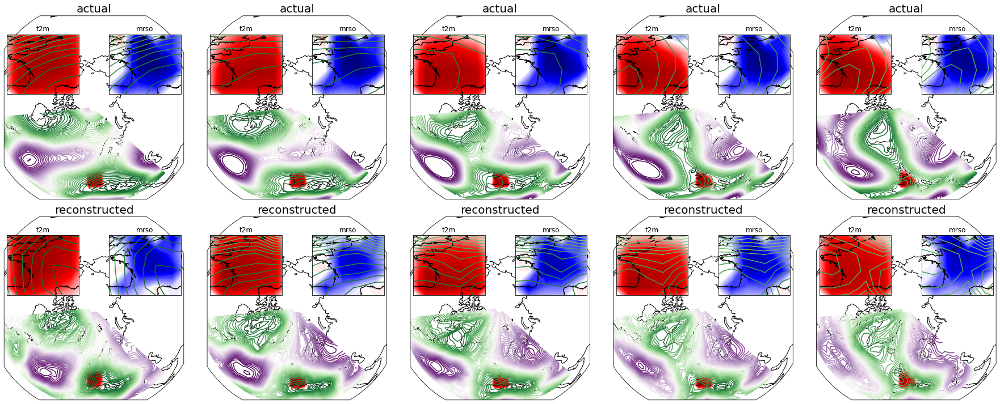

In [7]:
logger = logging.getLogger(__name__)
logger.level = logging.INFO

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import cartopy.mpl.geoaxes

import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeat
data_proj = ccrs.PlateCarree()
sys.path.insert(1, '../ERA')
import cartopy_plots as cplt


example_images = X_va[:5]

def plot_compare(model, images=None): 
    # Plot images as well as their reconstruction
    model.encoder(images)
    mean, logvar, z_sample = model.encoder(images)
    reconst_images = model.decoder(z_sample).numpy()
    
    reconst_images2 = reconst_images[...,2] # remove extra fields 
    reconst_images1 = reconst_images[...,1] # remove extra fields 
    reconst_images0 = reconst_images[...,0] # remove extra fields 
    logger.info(f"{reconst_images.shape = }")
    images2 = images[...,2]
    images1 = images[...,1]
    images0 = images[...,0]
    logger.info(f"{images0.shape = }")
    
    n_to_show = 2*images0.shape[0]
    
    levels = np.linspace(0, 1, 64)
    logger.info(f"{levels = }")
    fig2 = plt.figure(figsize=(25, 10))
    spec2 = gridspec.GridSpec(ncols=5, nrows=2, figure=fig2)
    iterate = 0
    jterate = 0
    ax = []
    axins = []
    for i in range(n_to_show):
        m = fig2.add_subplot(spec2[jterate,iterate], projection=ccrs.Orthographic(central_latitude=90))
        ax.append(m)
        if jterate == 0:
            img2 = images2[i].squeeze()
            img1 = images1[i].squeeze() 
            img0 = images0[i].squeeze() 
        else:
            img2 = reconst_images2[i-5].squeeze() 
            img1 = reconst_images1[i-5].squeeze()  
            img0 = reconst_images0[i-5].squeeze()  
        logger.info(f"{iterate = }, {jterate = },{img0.shape = },{img0.min() = }, {img0.max() = }")
        m.set_extent([-180,180, 30, 90], crs=data_proj)
        
        logger.info(f"{LON.shape = } ,{LAT.shape = } ,{img0.shape = }, {img1.shape = }")
        if jterate == 0:
            ef.geo_contourf(m, ax[iterate], 0, LON, LAT,img0,levels, "seismic", f"actual", put_colorbar=False, draw_gridlines=False)
            ef.geo_contour (m, ax[iterate], 0, LON, LAT,img1,levels, "summer", "PRGn")
        else:
            ef.geo_contourf(m, ax[iterate], 0, LON, LAT,img0,levels, "seismic", f"reconstructed", put_colorbar=False, draw_gridlines=False)
            ef.geo_contour (m, ax[iterate], 0, LON, LAT,img1,levels, "summer", "PRGn")
            
        for img_sub, loc_string, title_sub in zip([img0, img2],["upper left","upper right"],["t2m","mrso"]):
            axins.append(inset_axes(m, width="40%", height="50%", loc=loc_string, 
                       axes_class=cartopy.mpl.geoaxes.GeoAxes, 
                       axes_kwargs=dict(map_projection=cartopy.crs.PlateCarree())))


            axins[-1].add_feature(cartopy.feature.COASTLINE)
            axins[-1].set_extent([-5,7, 42, 52], crs=data_proj)

            ef.geo_contourf(axins[-1], ax[iterate], 0, LON, LAT,img_sub,levels, "seismic", "", put_colorbar=False, draw_gridlines=False)
            ef.geo_contour (axins[-1], ax[iterate], 0, LON, LAT,img1,levels, "summer", "PRGn")


            axins[-1].set_title(title_sub)
            
            
        iterate += 1
        if iterate > 4:
            iterate = 0
            jterate = 1
    fig2.tight_layout()
    fig2.savefig(f"Images/reconstruction{checkpoint}.png", bbox_inches='tight', dpi=200)
    logger.info(f" saved to Images/reconstruction{checkpoint}.png")
plot_compare(vae,example_images)

In [8]:
analogues.keys()

dict_keys(['dist_tr', 'ind_new_tr', 'dist_va', 'ind_new_va'])

In [9]:
analogues['ind_new_tr'][1000][:30]

array([[    0,     1, 42841, ..., 21158, 15156, 15774],
       [    1,     2,     0, ..., 42575, 37237, 42349],
       [    2,     3,     1, ...,  1151, 37245,  5515],
       ...,
       [   27,    28,  1093, ..., 30772, 28589, 11166],
       [   28,  1092,    29, ..., 10891, 31960, 32165],
       [   29,  1092,    28, ..., 42967, 46948,  6539]])

analogues['ind_new_tr'][1000][iX,:5] = array([41905, 31166, 17336, 41906, 41904])
reconst_images.shape = (5, 24, 48, 3)
images0.shape = (5, 24, 48)
levels = array([0.        , 0.01587302, 0.03174603, 0.04761905, 0.06349206,
       0.07936508, 0.0952381 , 0.11111111, 0.12698413, 0.14285714,
       0.15873016, 0.17460317, 0.19047619, 0.20634921, 0.22222222,
       0.23809524, 0.25396825, 0.26984127, 0.28571429, 0.3015873 ,
       0.31746032, 0.33333333, 0.34920635, 0.36507937, 0.38095238,
       0.3968254 , 0.41269841, 0.42857143, 0.44444444, 0.46031746,
       0.47619048, 0.49206349, 0.50793651, 0.52380952, 0.53968254,
       0.55555556, 0.57142857, 0.58730159, 0.6031746 , 0.61904762,
       0.63492063, 0.65079365, 0.66666667, 0.68253968, 0.6984127 ,
       0.71428571, 0.73015873, 0.74603175, 0.76190476, 0.77777778,
       0.79365079, 0.80952381, 0.82539683, 0.84126984, 0.85714286,
       0.87301587, 0.88888889, 0.9047619 , 0.92063492, 0.93650794,
       0.95238095, 0.96825397, 0.984126

/tmp/ipykernel_1578531/4121339317.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig2.tight_layout()


 saved to Images/reconstruction1000.png


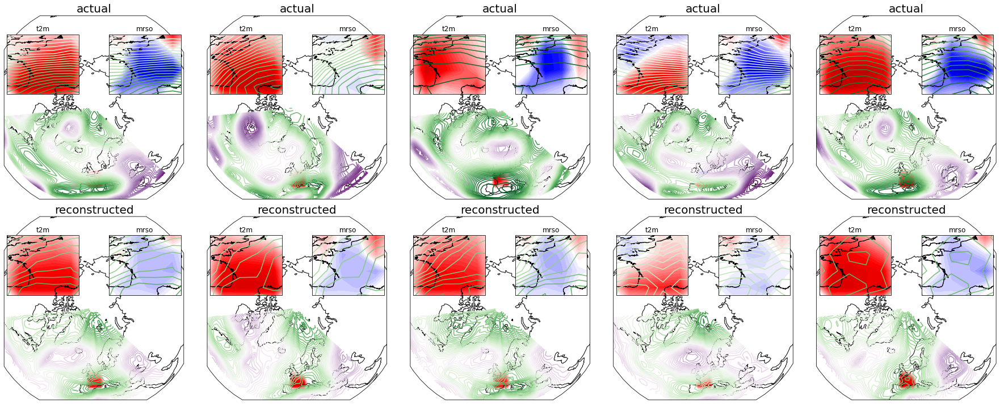

In [10]:
import random as rd
rd.seed(a=42)
iX = rd.randrange(len(X_tr))
logger.info(f"{analogues['ind_new_tr'][1000][iX,:5] = }")
plot_compare(vae,X_tr[analogues['ind_new_tr'][1000][iX,:5]])

analogues['ind_new_va'][1000][iX,:5] = array([45805, 14432, 43013, 23596, 47085])
reconst_images.shape = (5, 24, 48, 3)
images0.shape = (5, 24, 48)
levels = array([0.        , 0.01587302, 0.03174603, 0.04761905, 0.06349206,
       0.07936508, 0.0952381 , 0.11111111, 0.12698413, 0.14285714,
       0.15873016, 0.17460317, 0.19047619, 0.20634921, 0.22222222,
       0.23809524, 0.25396825, 0.26984127, 0.28571429, 0.3015873 ,
       0.31746032, 0.33333333, 0.34920635, 0.36507937, 0.38095238,
       0.3968254 , 0.41269841, 0.42857143, 0.44444444, 0.46031746,
       0.47619048, 0.49206349, 0.50793651, 0.52380952, 0.53968254,
       0.55555556, 0.57142857, 0.58730159, 0.6031746 , 0.61904762,
       0.63492063, 0.65079365, 0.66666667, 0.68253968, 0.6984127 ,
       0.71428571, 0.73015873, 0.74603175, 0.76190476, 0.77777778,
       0.79365079, 0.80952381, 0.82539683, 0.84126984, 0.85714286,
       0.87301587, 0.88888889, 0.9047619 , 0.92063492, 0.93650794,
       0.95238095, 0.96825397, 0.984126

/tmp/ipykernel_1578531/4121339317.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig2.tight_layout()


 saved to Images/reconstruction1000.png


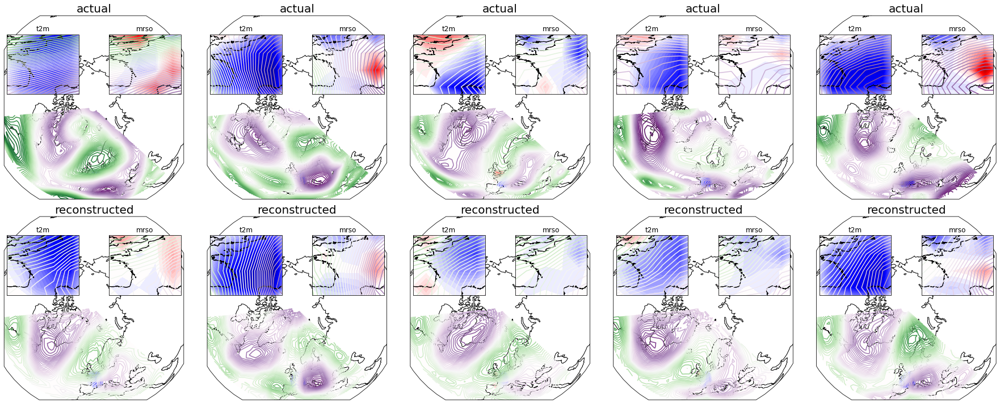

In [11]:
import random as rd
rd.seed(a=42)
iX = rd.randrange(len(X_va))
logger.info(f"{analogues['ind_new_va'][1000][iX,:5] = }")
plot_compare(vae,X_tr[analogues['ind_new_va'][1000][iX,:5]])

analogues['ind_new_va'][1000][iX,:5] = array([46711, 43625, 40063, 13287, 39115])
reconst_images.shape = (5, 24, 48, 3)
images0.shape = (5, 24, 48)
levels = array([0.        , 0.01587302, 0.03174603, 0.04761905, 0.06349206,
       0.07936508, 0.0952381 , 0.11111111, 0.12698413, 0.14285714,
       0.15873016, 0.17460317, 0.19047619, 0.20634921, 0.22222222,
       0.23809524, 0.25396825, 0.26984127, 0.28571429, 0.3015873 ,
       0.31746032, 0.33333333, 0.34920635, 0.36507937, 0.38095238,
       0.3968254 , 0.41269841, 0.42857143, 0.44444444, 0.46031746,
       0.47619048, 0.49206349, 0.50793651, 0.52380952, 0.53968254,
       0.55555556, 0.57142857, 0.58730159, 0.6031746 , 0.61904762,
       0.63492063, 0.65079365, 0.66666667, 0.68253968, 0.6984127 ,
       0.71428571, 0.73015873, 0.74603175, 0.76190476, 0.77777778,
       0.79365079, 0.80952381, 0.82539683, 0.84126984, 0.85714286,
       0.87301587, 0.88888889, 0.9047619 , 0.92063492, 0.93650794,
       0.95238095, 0.96825397, 0.984126

/tmp/ipykernel_1578531/4121339317.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig2.tight_layout()


 saved to Images/reconstruction1000.png


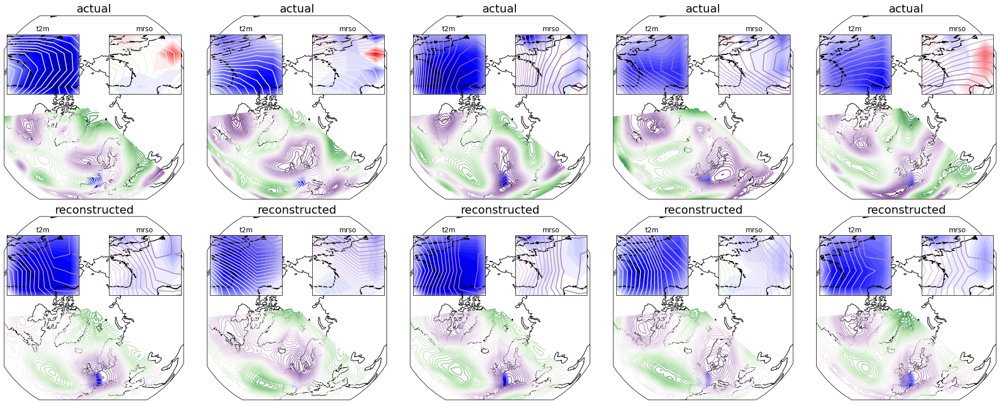

In [12]:
import random as rd
rd.seed(a=24)
iX = rd.randrange(len(X_va))
logger.info(f"{analogues['ind_new_va'][1000][iX,:5] = }")
plot_compare(vae,X_tr[analogues['ind_new_va'][1000][iX,:5]])

analogues['ind_new_va'][1000][iX,:5] = array([22765, 19371, 15746, 22764, 22766])
reconst_images.shape = (5, 24, 48, 3)
images0.shape = (5, 24, 48)
levels = array([0.        , 0.01587302, 0.03174603, 0.04761905, 0.06349206,
       0.07936508, 0.0952381 , 0.11111111, 0.12698413, 0.14285714,
       0.15873016, 0.17460317, 0.19047619, 0.20634921, 0.22222222,
       0.23809524, 0.25396825, 0.26984127, 0.28571429, 0.3015873 ,
       0.31746032, 0.33333333, 0.34920635, 0.36507937, 0.38095238,
       0.3968254 , 0.41269841, 0.42857143, 0.44444444, 0.46031746,
       0.47619048, 0.49206349, 0.50793651, 0.52380952, 0.53968254,
       0.55555556, 0.57142857, 0.58730159, 0.6031746 , 0.61904762,
       0.63492063, 0.65079365, 0.66666667, 0.68253968, 0.6984127 ,
       0.71428571, 0.73015873, 0.74603175, 0.76190476, 0.77777778,
       0.79365079, 0.80952381, 0.82539683, 0.84126984, 0.85714286,
       0.87301587, 0.88888889, 0.9047619 , 0.92063492, 0.93650794,
       0.95238095, 0.96825397, 0.984126

/tmp/ipykernel_1578531/4121339317.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig2.tight_layout()


 saved to Images/reconstruction1000.png


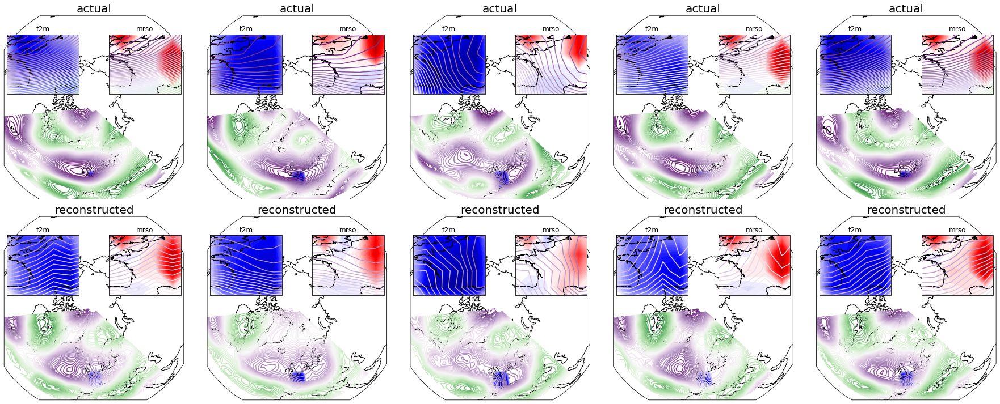

In [13]:
import random as rd
rd.seed(a=142)
iX = rd.randrange(len(X_va))
logger.info(f"{analogues['ind_new_va'][1000][iX,:5] = }")
plot_compare(vae,X_tr[analogues['ind_new_va'][1000][iX,:5]])

analogues['ind_new_va'][1000][iX,:5] = array([38262, 25874,  5928,  7946,  6357])
reconst_images.shape = (5, 24, 48, 3)
images0.shape = (5, 24, 48)
levels = array([0.        , 0.01587302, 0.03174603, 0.04761905, 0.06349206,
       0.07936508, 0.0952381 , 0.11111111, 0.12698413, 0.14285714,
       0.15873016, 0.17460317, 0.19047619, 0.20634921, 0.22222222,
       0.23809524, 0.25396825, 0.26984127, 0.28571429, 0.3015873 ,
       0.31746032, 0.33333333, 0.34920635, 0.36507937, 0.38095238,
       0.3968254 , 0.41269841, 0.42857143, 0.44444444, 0.46031746,
       0.47619048, 0.49206349, 0.50793651, 0.52380952, 0.53968254,
       0.55555556, 0.57142857, 0.58730159, 0.6031746 , 0.61904762,
       0.63492063, 0.65079365, 0.66666667, 0.68253968, 0.6984127 ,
       0.71428571, 0.73015873, 0.74603175, 0.76190476, 0.77777778,
       0.79365079, 0.80952381, 0.82539683, 0.84126984, 0.85714286,
       0.87301587, 0.88888889, 0.9047619 , 0.92063492, 0.93650794,
       0.95238095, 0.96825397, 0.984126

/tmp/ipykernel_1578531/4121339317.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig2.tight_layout()


 saved to Images/reconstruction1000.png


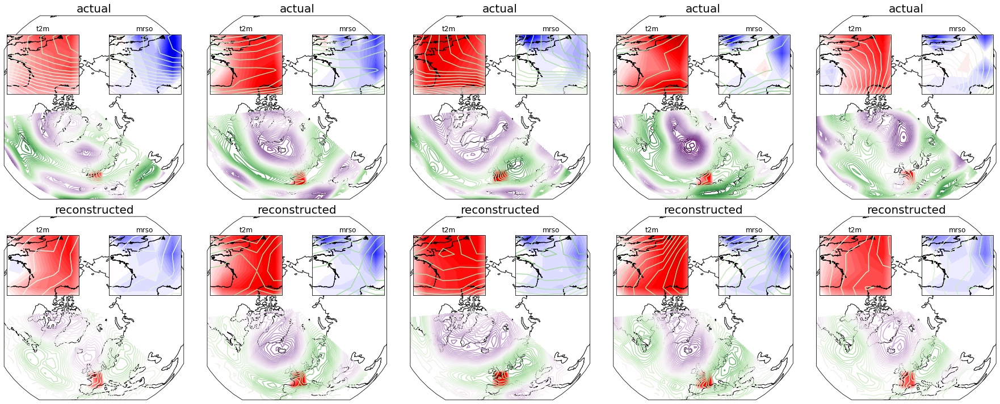

In [14]:
import random as rd
rd.seed(a=1)
iX = rd.randrange(len(X_va))
logger.info(f"{analogues['ind_new_va'][1000][iX,:5] = }")
plot_compare(vae,X_tr[analogues['ind_new_va'][1000][iX,:5]])

In [1]:
import numpy as np
folder = './xforanalogs/NA24by48/Z8/yrs500/interT15fw20.1.20lrs4'
Y = np.load(f"{folder}/Y.npy")

In [7]:
Y.reshape(500,-1).shape

(500, 105)